In [1]:
import pandas as pd
import re
import numpy as np
from datetime import datetime
import seaborn as sns
from sklearn import preprocessing
pd.set_option('display.max_rows', 500)
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import chi2
pd.set_option('display.max_columns', 150)

In [2]:
#! pip install cufflinks
import plotly.offline as py 
#py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features
import plotly.io as pio
#import all required libraries
#Data Analysis
import pandas as pd
import numpy as np
import json
#Visulaization libraries
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.palettes import Viridis5
import seaborn as sns
import matplotlib.pyplot as plt
import pygal
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
#model developemnt libraries


In [3]:
df = pd.read_csv("loan.csv")
print(df.shape)
df.head()

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning:

Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.



(39717, 111)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [4]:
df.isna().sum()[df.isna().sum()/len(df)>0]/len(df)

emp_title                         0.061913
emp_length                        0.027066
desc                              0.325805
title                             0.000277
mths_since_last_delinq            0.646625
mths_since_last_record            0.929854
revol_util                        0.001259
last_pymnt_d                      0.001788
next_pymnt_d                      0.971297
last_credit_pull_d                0.000050
collections_12_mths_ex_med        0.001410
mths_since_last_major_derog       1.000000
annual_inc_joint                  1.000000
dti_joint                         1.000000
verification_status_joint         1.000000
tot_coll_amt                      1.000000
tot_cur_bal                       1.000000
open_acc_6m                       1.000000
open_il_6m                        1.000000
open_il_12m                       1.000000
open_il_24m                       1.000000
mths_since_rcnt_il                1.000000
total_bal_il                      1.000000
il_util    

* In above we are only seeing the columns which are having missing data

* Here we are replacing the missing values in the title with mode as we can see that the column is categorical.

In [5]:
df["emp_title"].fillna(df["emp_title"].mode()[0],inplace=True)
df["emp_length"].fillna(df["emp_length"].mode()[0],inplace=True)
df["title"].fillna(df["title"].mode()[0],inplace=True)
df["last_pymnt_d"].fillna(df["last_pymnt_d"].mode()[0],inplace=True)
df["last_credit_pull_d"].fillna(df["last_credit_pull_d"].mode()[0],inplace=True)
df["pub_rec_bankruptcies"].fillna(df["pub_rec_bankruptcies"].mode()[0],inplace=True)

In [6]:
df["desc"]

0          Borrower added on 12/22/11 > I need to upgra...
1          Borrower added on 12/22/11 > I plan to use t...
2                                                      NaN
3          Borrower added on 12/21/11 > to pay for prop...
4          Borrower added on 12/21/11 > I plan on combi...
                               ...                        
39712    Our current gutter system on our home is old a...
39713    The rate of interest and fees incurred by carr...
39714                                                  NaN
39715                                                  NaN
39716    I plan to consolidate over $7,000 of debt: a c...
Name: desc, Length: 39717, dtype: object

* I think we can simply remove desc column because its not categorical or numerical its not possible to impute missing values as the values are description.


In [7]:
df["revol_util"]

0        83.70%
1         9.40%
2        98.50%
3           21%
4        53.90%
          ...  
39712    13.10%
39713    26.90%
39714    19.40%
39715     0.70%
39716    51.50%
Name: revol_util, Length: 39717, dtype: object

* As we can observe that the values are treated as strings , we are using split method to extraxt the percentage values .


In [8]:
df["revol_util"]=df["revol_util"].str.split("%",expand=True)[0].astype(float)
df["revol_util"]

0        83.7
1         9.4
2        98.5
3        21.0
4        53.9
         ... 
39712    13.1
39713    26.9
39714    19.4
39715     0.7
39716    51.5
Name: revol_util, Length: 39717, dtype: float64

* After that we will replace the missing values by mean as it is a contenous variable.

In [9]:
df["revol_util"].fillna(df["revol_util"].mean(),inplace=True)

In [10]:
df["collections_12_mths_ex_med"].value_counts()

0.0    39661
Name: collections_12_mths_ex_med, dtype: int64

In [11]:
df["chargeoff_within_12_mths"].value_counts()

0.0    39661
Name: chargeoff_within_12_mths, dtype: int64

In [12]:
df["tax_liens"].value_counts()

0.0    39678
Name: tax_liens, dtype: int64

* we can remove these two columns collections_12_mths_ex_med, tax_liens and  chargeoff_within_12_mths as all the entries are only zero which doesnt give any insights.

In [13]:
df["home_ownership"].value_counts()

RENT        18899
MORTGAGE    17659
OWN          3058
OTHER          98
NONE            3
Name: home_ownership, dtype: int64

*  If we onbserve the home_ownership column we can see that  values are String none which cannot be detected as none in pandas so we are replacingthem manually by mode which is RENT.

In [14]:
df['home_ownership'].replace('NONE', "RENT", inplace=True)

In [15]:
x=df.isna().sum()[df.isna().sum()/len(df)>0]/len(df)
del_cols = list(dict(x).keys())
del_cols

['desc',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'next_pymnt_d',
 'collections_12_mths_ex_med',
 'mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'chargeoff_within_12_mths',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd

* These are the columns which are to be deleted because of more missing values or having same values on whole rows.
* So we are removing them to proceed further EDA.

In [16]:
df.drop(columns=del_cols,inplace=True)

In [17]:
df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 'policy_code',
       'application_type', 'acc_now_delinq', 'delinq_amnt',
       'pub_rec_bankruptcies'],
      dtype='object')

In [18]:
df.shape

(39717, 50)

* Let us see the correlation matrix of the whole data.

In [19]:
df.corr()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,policy_code,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies
id,1.000000,0.993650,0.141919,0.152286,0.249547,0.086587,0.008731,0.095983,-0.008644,-0.042378,0.020388,-0.019440,0.008763,0.094772,0.042149,0.180619,0.180591,0.140045,0.220838,0.112213,0.172856,-0.055082,0.033426,-0.013359,0.122365,NaN,NaN,NaN,-0.000569
member_id,0.993650,1.000000,0.140710,0.150322,0.257887,0.081025,0.009380,0.096963,-0.008119,-0.047086,0.017928,-0.018721,0.005113,0.093032,0.044374,0.170743,0.170706,0.139975,0.229307,0.112168,0.173234,-0.057750,0.031565,-0.015155,0.123627,NaN,NaN,NaN,0.000809
loan_amnt,0.141919,0.140710,1.000000,0.981578,0.940034,0.930288,0.271149,0.066439,-0.031864,0.009229,0.177168,-0.051236,0.317597,0.066107,0.256442,0.192937,0.192623,0.886613,0.854243,0.852021,0.729726,0.044706,0.135446,0.072853,0.448742,NaN,NaN,NaN,-0.036284
funded_amnt,0.152286,0.150322,0.981578,1.000000,0.958422,0.956159,0.266965,0.066283,-0.032355,0.009259,0.175530,-0.052169,0.310392,0.069917,0.250589,0.194941,0.194675,0.903160,0.870799,0.870255,0.737469,0.046705,0.136284,0.074676,0.453133,NaN,NaN,NaN,-0.037636
funded_amnt_inv,0.249547,0.257887,0.940034,0.958422,1.000000,0.905039,0.254375,0.074689,-0.038501,-0.005712,0.163027,-0.053214,0.290797,0.074891,0.242854,0.203688,0.203693,0.881228,0.913257,0.845848,0.730914,0.027172,0.123759,0.060358,0.442604,NaN,NaN,NaN,-0.037982
installment,0.086587,0.081025,0.930288,0.956159,0.905039,1.000000,0.270874,0.054186,-0.019657,0.009722,0.172812,-0.046532,0.312679,0.095427,0.230824,0.125082,0.124932,0.856928,0.817416,0.850773,0.634725,0.056709,0.118152,0.075467,0.401688,NaN,NaN,NaN,-0.033746
annual_inc,0.008731,0.009380,0.271149,0.266965,0.254375,0.270874,1.000000,-0.122732,0.023083,0.033908,0.158200,-0.018689,0.279961,0.017914,0.235771,0.033573,0.033472,0.257980,0.247119,0.259571,0.185476,0.006243,0.021589,0.015604,0.140401,NaN,NaN,NaN,-0.016514
dti,0.095983,0.096963,0.066439,0.066283,0.074689,0.054186,-0.122732,1.000000,-0.034452,0.001405,0.288045,-0.004621,0.228743,0.277709,0.229881,0.036095,0.036012,0.064766,0.071647,0.041316,0.106071,-0.011781,0.024878,0.011033,0.005212,NaN,NaN,NaN,0.007021
delinq_2yrs,-0.008644,-0.008119,-0.031864,-0.032355,-0.038501,-0.019657,0.023083,-0.034452,1.000000,0.008091,0.011656,0.007463,-0.055125,-0.043049,0.067892,-0.003008,-0.003203,-0.022695,-0.028976,-0.038795,0.023077,0.030609,0.012315,0.013912,-0.012149,NaN,NaN,NaN,0.002954
inq_last_6mths,-0.042378,-0.047086,0.009229,0.009259,-0.005712,0.009722,0.033908,0.001405,0.008091,1.000000,0.091713,0.024802,-0.022381,-0.068554,0.111499,-0.012106,-0.011780,-0.010559,-0.020277,-0.023433,0.021774,0.031215,0.018972,0.012420,0.028514,NaN,NaN,NaN,0.015652


* As we can see that three columns acc_now_delinq,delinq_amnt and policy_code are having null values as correlation .
* Let us examine them one by one to see what was happening there.

In [20]:
df["acc_now_delinq"].value_counts()

0    39717
Name: acc_now_delinq, dtype: int64

In [21]:
df["delinq_amnt"].value_counts()

0    39717
Name: delinq_amnt, dtype: int64

In [22]:
df["policy_code"].value_counts()

1    39717
Name: policy_code, dtype: int64

* As we can see that these three columns are having the same values through out the entries so these columns will not give any meaning so we will remove them from data.

In [23]:
df.drop(columns=["policy_code","delinq_amnt","acc_now_delinq"],inplace=True)

<AxesSubplot:>

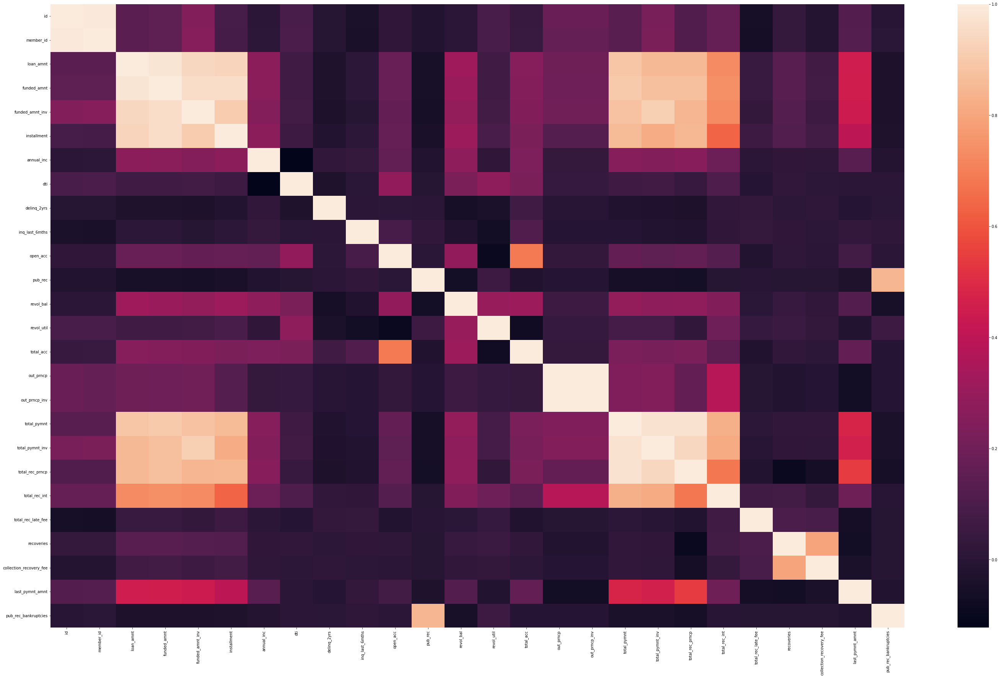

In [24]:
data_correlation = df.corr()
plt.rcParams["figure.figsize"] = [50,30]#corellation graph
sns.heatmap(data_correlation,xticklabels=data_correlation.columns,yticklabels=data_correlation.columns)

* From the Graph we can observe that the columns 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int' and 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment' are correlated very much so if we are dealing with the  models we need to remove these columns to avoid Multi Collinearity.
* We can observe that only some columns have came in the heat map because some columns are object data types.
* So we will convert these categorical columns to Numerical by using encoding technique.

In [25]:
print(df.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'application_type', 'pub_rec_bankruptcies'],
      dtype='object')


In [26]:
df.describe()


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,9.294408,0.055065,13382.528086,48.832152,22.088828,51.227887,50.989768,12153.596544,11567.149118,9793.348813,2263.663172,1.363015,95.221624,12.406112,2678.826162,0.042501
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,4.400282,0.237200,15885.016641,28.314793,11.401709,375.172839,373.824457,9042.040766,8942.672613,7065.522127,2608.111964,7.289979,688.744771,148.671593,4447.136012,0.202603
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,6.000000,0.000000,3703.000000,25.500000,13.000000,0.000000,0.000000,5576.930000,5112.310000,4600.000000,662.180000,0.000000,0.000000,0.000000,218.680000,0.000000
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,9.000000,0.000000,8850.000000,49.200000,20.000000,0.000000,0.000000,9899.640319,9287.150000,8000.000000,1348.910000,0.000000,0.000000,0.000000,546.140000,0.000000
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,12.000000,0.000000,17058.000000,72.300000,29.000000,0.000000,0.000000,16534.433040,15798.810000,13653.260000,2833.400000,0.000000,0.000000,0.000000,3293.160000,0.000000
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,44.000000,4.000000,149588.000000,99.900000,90.000000,6311.470000,6307.370000,58563.679930,58563.680000,35000.020000,23563.680000,180.200000,29623.350000,7002.190000,36115.200000,2.000000


In [27]:
cat_cols=[]
for i in df.columns:
    if df[i].dtype==object:
        cat_cols.append(i)
cat_cols

['term',
 'int_rate',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'pymnt_plan',
 'url',
 'purpose',
 'title',
 'zip_code',
 'addr_state',
 'earliest_cr_line',
 'initial_list_status',
 'last_pymnt_d',
 'last_credit_pull_d',
 'application_type']

* These are the list of categorical columns , so lets grough each one of them to understand them briefly.

In [28]:
df["term"].value_counts()

 36 months    29096
 60 months    10621
Name: term, dtype: int64

* we can observe that we are having only 2 values so we can keep them as it is instead of extracting months from them.

In [29]:
df["int_rate"]

0        10.65%
1        15.27%
2        15.96%
3        13.49%
4        12.69%
          ...  
39712     8.07%
39713    10.28%
39714     8.07%
39715     7.43%
39716    13.75%
Name: int_rate, Length: 39717, dtype: object

* We can see that we can extract the values from the strings using split methods.

In [30]:
df["int_rate"]=df["int_rate"].str.replace("%","").astype(float)

In [31]:
df["emp_length"]

0        10+ years
1         < 1 year
2        10+ years
3        10+ years
4           1 year
           ...    
39712      4 years
39713      3 years
39714     < 1 year
39715     < 1 year
39716     < 1 year
Name: emp_length, Length: 39717, dtype: object

* We can see that the column is having the length of employability , so we will use regular expressions to extract numbers from the strings  as shown below.


In [32]:
df["emp_length"] = df["emp_length"].apply(lambda x:int(re.search(r'\d+', x).group()))
df["emp_length"]

0        10
1         1
2        10
3        10
4         1
         ..
39712     4
39713     3
39714     1
39715     1
39716     1
Name: emp_length, Length: 39717, dtype: int64

In [33]:
len(df["grade"].value_counts())

7

In [34]:
len(df["sub_grade"].value_counts())

35

In [35]:
len(df["home_ownership"].value_counts()) 

4

In [36]:
len(df["verification_status"].value_counts())

3

In [37]:
len(df["loan_status"].value_counts())

3

In [38]:
len(df["purpose"].value_counts())

14

In [39]:
len(df["addr_state"].value_counts())

50

* We can Observe that we can able to encode all of the above columns as the distinct value counts of each column are very less.

In [40]:
len(df["emp_title"].value_counts())  # no encoding

28820

In [41]:
len(df["title"].value_counts()) # no encoding

19615

In [42]:
len(df["zip_code"].value_counts()) # no encoding

823

* now if we Observe all the abobve columns have more distinct values so its very hard to encode them , so we will add these column name's to noenc list to remove them at last.

In [43]:
noenc = ["emp_title","title","zip_code"]

* We can Observe that home_ownership and verification_status are only having 4 and 3 distinct values so we can encode them.

In [44]:
df["issue_d"]

0        Dec-11
1        Dec-11
2        Dec-11
3        Dec-11
4        Dec-11
          ...  
39712    Jul-07
39713    Jul-07
39714    Jul-07
39715    Jul-07
39716    Jun-07
Name: issue_d, Length: 39717, dtype: object

* As we observe that the values are in the form of string dates so we will convert them into dateformat as shown below.

In [45]:
df["issue_d"]=df["issue_d"].apply(lambda x:datetime.strptime(x, '%b-%y'))
df["earliest_cr_line"] = df["earliest_cr_line"].apply(lambda x:datetime.strptime(x, '%b-%y'))
df["last_pymnt_d"] = df["last_pymnt_d"].apply(lambda x:datetime.strptime(x, '%b-%y'))
df["last_credit_pull_d"] = df["last_credit_pull_d"].apply(lambda x:datetime.strptime(x, '%b-%y'))

In [46]:
df["pymnt_plan"].value_counts() # no use 

n    39717
Name: pymnt_plan, dtype: int64

In [47]:
df["initial_list_status"].value_counts() # no use

f    39717
Name: initial_list_status, dtype: int64

In [48]:
df["application_type"].value_counts()

INDIVIDUAL    39717
Name: application_type, dtype: int64

* We can see that pymnt_plan,initial_list_status and application_type are having same constant value all across the data so we can drop them.

In [49]:
df.drop(columns=["pymnt_plan","initial_list_status","application_type"],inplace=True)


In [50]:
df["url"]  #no encoding

0        https://lendingclub.com/browse/loanDetail.acti...
1        https://lendingclub.com/browse/loanDetail.acti...
2        https://lendingclub.com/browse/loanDetail.acti...
3        https://lendingclub.com/browse/loanDetail.acti...
4        https://lendingclub.com/browse/loanDetail.acti...
                               ...                        
39712    https://lendingclub.com/browse/loanDetail.acti...
39713    https://lendingclub.com/browse/loanDetail.acti...
39714    https://lendingclub.com/browse/loanDetail.acti...
39715    https://lendingclub.com/browse/loanDetail.acti...
39716    https://lendingclub.com/browse/loanDetail.acti...
Name: url, Length: 39717, dtype: object

* As we can observe the url column these are the url's of loan details which are distinct which doesnt give any use for EDA so we can drop this column . 

In [51]:
df.drop(columns="url",inplace=True)

In [52]:
t ="""delinq_2yrs

earliest_cr_line

inq_last_6mths

open_acc pub_rec

total_pymnt_inv

total_rec_prncp

total_rec_int

total_rec_late_fee

recoveries

revol_bal out_prncp_inv

total_acc revol_util out_prncp

total_pymnt

last_credit_pull_d

last_pymnt_d

last_pymnt_amnt

collection_recovery_fee"""
t.split()

['delinq_2yrs',
 'earliest_cr_line',
 'inq_last_6mths',
 'open_acc',
 'pub_rec',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'revol_bal',
 'out_prncp_inv',
 'total_acc',
 'revol_util',
 'out_prncp',
 'total_pymnt',
 'last_credit_pull_d',
 'last_pymnt_d',
 'last_pymnt_amnt',
 'collection_recovery_fee']

In [53]:
for i in t.split():
    try:
        df.drop(columns=i,inplace=True)
    except:
        pass

### Now we will Remove The data with loan_status as Current.

In [54]:
df = df[df["loan_status"]!= 'Current']

In [55]:
cat_cols=[]
for i in df.columns:
    if df[i].dtype==object:
        cat_cols.append(i)
cat_cols

['term',
 'grade',
 'sub_grade',
 'emp_title',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'title',
 'zip_code',
 'addr_state']

* Now from the list of category column names we will remove noenc list which is the list of column which doesnt require encyption.

In [56]:
for i in noenc:
    cat_cols.remove(i)

In [57]:
cat_cols

['term',
 'grade',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state']

* Now we are going to Encode the Following columns.

In [58]:
categorical_column =cat_cols
data_encoded = df.copy(deep=True)#deep copying
lab_enc = preprocessing.LabelEncoder()
for col in categorical_column:
        data_encoded[col] = lab_enc.fit_transform(df[col])#column names keeping same
        le_name_mapping = dict(zip(lab_enc.classes_, lab_enc.transform(lab_enc.classes_)))#automatic labeling
        print('Feature : ', col)#printing All 
        print('\t mapping : ', le_name_mapping)

Feature :  term
	 mapping :  {' 36 months': 0, ' 60 months': 1}
Feature :  grade
	 mapping :  {'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6}
Feature :  sub_grade
	 mapping :  {'A1': 0, 'A2': 1, 'A3': 2, 'A4': 3, 'A5': 4, 'B1': 5, 'B2': 6, 'B3': 7, 'B4': 8, 'B5': 9, 'C1': 10, 'C2': 11, 'C3': 12, 'C4': 13, 'C5': 14, 'D1': 15, 'D2': 16, 'D3': 17, 'D4': 18, 'D5': 19, 'E1': 20, 'E2': 21, 'E3': 22, 'E4': 23, 'E5': 24, 'F1': 25, 'F2': 26, 'F3': 27, 'F4': 28, 'F5': 29, 'G1': 30, 'G2': 31, 'G3': 32, 'G4': 33, 'G5': 34}
Feature :  home_ownership
	 mapping :  {'MORTGAGE': 0, 'OTHER': 1, 'OWN': 2, 'RENT': 3}
Feature :  verification_status
	 mapping :  {'Not Verified': 0, 'Source Verified': 1, 'Verified': 2}
Feature :  loan_status
	 mapping :  {'Charged Off': 0, 'Fully Paid': 1}
Feature :  purpose
	 mapping :  {'car': 0, 'credit_card': 1, 'debt_consolidation': 2, 'educational': 3, 'home_improvement': 4, 'house': 5, 'major_purchase': 6, 'medical': 7, 'moving': 8, 'other': 9, 'renewable_ene

* Now we will rename the df with data_encoded where will store all the encoded data in numerical format.

In [59]:
data_encoded

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,0,10.65,162.87,1,6,US Army,10,3,24000.0,2,2011-12-01,1,1,Computer,860xx,3,27.65,0.0
1,1077430,1314167,2500,2500,2500.0,1,15.27,59.83,2,13,Ryder,1,3,30000.0,1,2011-12-01,0,0,bike,309xx,10,1.00,0.0
2,1077175,1313524,2400,2400,2400.0,0,15.96,84.33,2,14,US Army,10,3,12252.0,0,2011-12-01,1,11,real estate business,606xx,14,8.72,0.0
3,1076863,1277178,10000,10000,10000.0,0,13.49,339.31,2,10,AIR RESOURCES BOARD,10,3,49200.0,1,2011-12-01,1,9,personel,917xx,4,20.00,0.0
5,1075269,1311441,5000,5000,5000.0,0,7.90,156.46,0,3,Veolia Transportaton,3,3,36000.0,1,2011-12-01,1,13,My wedding loan I promise to pay back,852xx,3,11.20,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,0,8.07,78.42,0,3,FiSite Research,4,0,110000.0,0,2007-07-01,1,4,Home Improvement,802xx,5,11.33,0.0
39713,90665,90607,8500,8500,875.0,0,10.28,275.38,2,10,"Squarewave Solutions, Ltd.",3,3,18000.0,0,2007-07-01,1,1,Retiring credit card debt,274xx,27,6.40,0.0
39714,90395,90390,5000,5000,1325.0,0,8.07,156.84,0,3,US Army,1,0,100000.0,0,2007-07-01,1,2,MBA Loan Consolidation,017xx,19,2.30,0.0
39715,90376,89243,5000,5000,650.0,0,7.43,155.38,0,1,US Army,1,0,200000.0,0,2007-07-01,1,9,JAL Loan,208xx,20,3.72,0.0


* Now we will see the heat map of the correlation matrix for only loan_status below.

<AxesSubplot:>

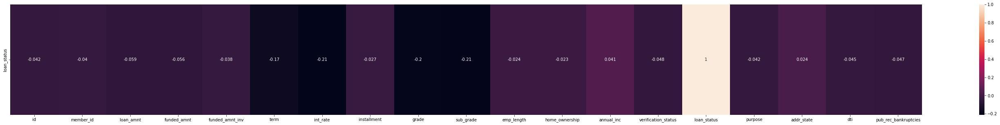

In [60]:
data_correlation = pd.DataFrame(data_encoded.corr()["loan_status"]).T
plt.rcParams["figure.figsize"] = [50,5]#corellation graph
sns.heatmap(data_correlation,xticklabels=data_correlation.columns,yticklabels=["loan_status"],annot=True)

In [61]:
data_correlation

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,pub_rec_bankruptcies
loan_status,-0.04239,-0.039798,-0.059463,-0.056497,-0.037781,-0.173487,-0.21139,-0.027153,-0.201869,-0.20532,-0.024023,-0.022945,0.040867,-0.048262,1.0,-0.041831,0.023912,-0.045078,-0.046989


* from picture we can observe that some variables are positively correlated and some are negatively correlated to loan_status let us visualise them each one by one to understand them.

In [62]:
input_data = data_encoded.drop(columns = noenc)
input_data = input_data.drop(columns=["loan_status","issue_d"])
input_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,purpose,addr_state,dti,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,0,10.65,162.87,1,6,10,3,24000.0,2,1,3,27.65,0.0
1,1077430,1314167,2500,2500,2500.0,1,15.27,59.83,2,13,1,3,30000.0,1,0,10,1.00,0.0
2,1077175,1313524,2400,2400,2400.0,0,15.96,84.33,2,14,10,3,12252.0,0,11,14,8.72,0.0
3,1076863,1277178,10000,10000,10000.0,0,13.49,339.31,2,10,10,3,49200.0,1,9,4,20.00,0.0
5,1075269,1311441,5000,5000,5000.0,0,7.90,156.46,0,3,3,3,36000.0,1,13,3,11.20,0.0


In [63]:
target_data = data_encoded[['loan_status']]
target_data.head()

,loan_status
0,1
1,0
2,1
3,1
5,1


#### Mutual Information Method
* Mutual information is 0, then variable X carries no information about the variable Y. X and Y are independent.
* Mutual information is 1, then variable X can be determined from variable Y. X and Y are dependent.

In [132]:
col_values = list(input_data.columns.values)
feature_scores = mutual_info_classif(input_data, target_data)
ans= {}
for score, fname in sorted(zip(feature_scores, col_values), reverse=True)[:5]:#Displays top 15
    print(fname, score)
    ans[fname]=score

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



int_rate 0.023070340737608275
sub_grade 0.022565154631639217
grade 0.021553623324785054
installment 0.01495406319828163
term 0.013737323799316359


In [133]:

layout = go.Layout(
    yaxis=dict(
        title='mutual index'
    ),
    xaxis=dict(
        title='variable'
    ),
    title=' variable importance'
)
fig = go.Figure(data=go.Bar(x = list(ans.keys()),y=list(ans.values())), layout=layout)

py.iplot(fig, filename='grouped-bar')

# Verification status 

In [72]:

tr0 = go.Bar(
            x = df[df["loan_status"]== 'Charged Off']["verification_status"].value_counts().index.values,
            y = df[df["loan_status"]== 'Charged Off']["verification_status"].value_counts().values,
            name='Charged Off'
    )

tr1 = go.Bar(
            x = df[df["loan_status"]== 'Fully Paid']["verification_status"].value_counts().index.values,
            y = df[df["loan_status"]== 'Fully Paid']["verification_status"].value_counts().values,
            name='Fully Paid'
    )


data = [tr0,tr1]

layout = go.Layout(
    yaxis=dict(
        title='Count'
    ),
    xaxis=dict(
        title='verification_status'
    ),
    title='Dependent variable distribution'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='grouped-bar')

* From thie above Graph we can observe that The Charged Off people in the verified status are more compared in proportion to the Not Verified People.
> <h3>conclusion </h3><br>
> It is better for approving the loan for applications with Not verified Verification status rather than Verified status.

# Grade 

In [73]:
tr0 = go.Bar(
            x = df[df["loan_status"]== 'Charged Off']["grade"].value_counts().index.values,
            y = df[df["loan_status"]== 'Charged Off']["grade"].value_counts().values,
            name='Charged Off'
    )

tr1 = go.Bar(
            x = df[df["loan_status"]== 'Fully Paid']["grade"].value_counts().index.values,
            y = df[df["loan_status"]== 'Fully Paid']["grade"].value_counts().values,
            name='Fully Paid'
    )


data = [tr0,tr1]

layout = go.Layout(
    
)

layout = go.Layout(
    yaxis=dict(
        title='Count'
    ),
    xaxis=dict(
        title='verification_status'
    ),
    title='Dependent variable distribution'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='grouped-bar')

* From the Graph we can Observe that The Persons in Group G,F and E are more Charged off group in comparison to other groups.
> <h3>conclusion </h3><br>
> It is more risky to give loans to people from the Group G,F and E.

# int_rate 

In [74]:
col = "int_rate"
df_good = df.loc[df["loan_status"] == 'Fully Paid'][col].values.tolist()
df_bad = df.loc[df["loan_status"] == 'Charged Off'][col].values.tolist()
df_col = df[col].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Charged off"
)
#Third plot
tr2 = go.Histogram(
    x=df_col,
    histnorm='probability',
    name="Overall "
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title=col+' Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



* If we observe the charged off people int_rate Distribution we can observe it is following symmetric distribution, but fully paid is following same distribution as Genera Distribution.

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



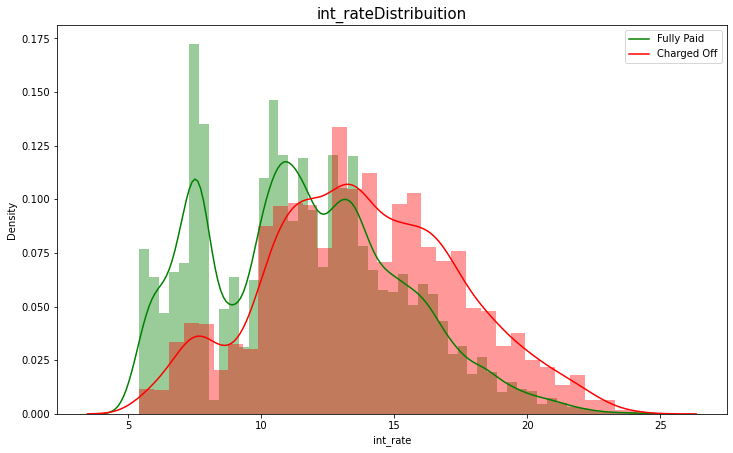

In [82]:
col = "int_rate"
df_good = df[df["loan_status"] == 'Fully Paid']
df_bad = df[df["loan_status"] == 'Charged Off']
fig, ax = plt.subplots(nrows=1, figsize=(12,8))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g1 = sns.distplot(df_good[col], ax=ax, 
             color="g")
g1 = sns.distplot(df_bad[col], ax=ax, 
             color='r')
g1.set_title(col+"Distribuition", fontsize=15)
g1.set_xlabel(col)
g1.set_xlabel(col)
plt.legend(["Fully Paid","Charged Off"])
plt.show()


> <h3>conclusion </h3><br>
> <li>From this we can conclude that the persons in the average range of intrest rate are more likey to charge off.</li>
> <li>We can also observe one more intresting this is that, the persons in the right ailed region are very less, which says if the intrest rate is more, poeple are less-likely to charge-off.</li>

# Term

In [75]:
col = "term"
df_good = df.loc[df["loan_status"] == 'Fully Paid'][col].values.tolist()
df_bad = df.loc[df["loan_status"] == 'Charged Off'][col].values.tolist()
df_age = df[col].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Fully Paid",
    nbinsx=2
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Charged off",
    nbinsx=2
)
#Third plot
tr2 = go.Histogram(
    x=df_age,
    histnorm='probability',
    name="Overall ",
    nbinsx=2
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title=col+' Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

> <h3>conclusion </h3><br>
> From the Graph we can clearly see that, the persons whose term is 60 months are more likely to charge off.

# installment

In [94]:
col = "installment"
df_good = df.loc[df["loan_status"] == 'Fully Paid'][col].values.tolist()
df_bad = df.loc[df["loan_status"] == 'Charged Off'][col].values.tolist()
df_col = df[col].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Charged off"
)

#Creating the grid
fig = tls.make_subplots(rows=1, cols=1)

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)

fig['layout'].update(showlegend=True, title=col+' Distribuition', bargap=0.0)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\LOKSUNDAR\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



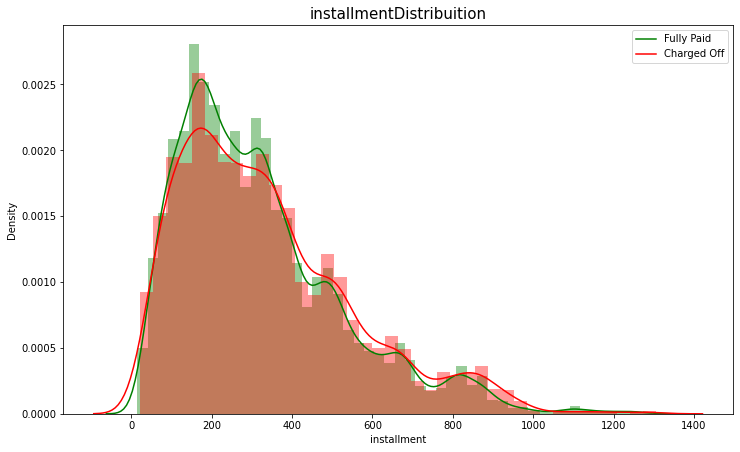

In [83]:
col = "installment"
df_good = df[df["loan_status"] == 'Fully Paid']
df_bad = df[df["loan_status"] == 'Charged Off']
fig, ax = plt.subplots(nrows=1, figsize=(12,8))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g1 = sns.distplot(df_good[col], ax=ax, 
             color="g")
g1 = sns.distplot(df_bad[col], ax=ax, 
             color='r')
g1.set_title(col+"Distribuition", fontsize=15)
g1.set_xlabel(col)
g1.set_xlabel(col)
plt.legend(["Fully Paid","Charged Off"])
plt.show()


> <h3>conclusion </h3><br>
> From the Graph we can clearly see that, the persons whose Installment is in the range 90 to 350 are more likely to pay loan fully.

In [105]:
df_good = df[df["loan_status"] == 'Fully Paid']
df_bad = df[df["loan_status"] == 'Charged Off']

# Bivariate 

In [108]:
#Distribuition of Credit Amount by Housing
fig = {
    "data": [
        {
            "type": 'violin',
            "x": df_good['home_ownership'],
            "y": df_good['funded_amnt'],
            "legendgroup": 'Fully Paid',
            "scalegroup": 'No',
            "name": 'Fully Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        {
            "type": 'violin',
            "x": df_bad['home_ownership'],
            "y": df_bad['funded_amnt'],
            "legendgroup": 'Charged Off',
            "scalegroup": 'No',
            "name": 'Charged Off',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin/split', validate = False)

* From this we can see that The home_ownership with OTHERS are funded with more amount compared to Remaining in the charged_off class.

In [125]:
#Distribuition of Credit Amount by Housing
fig = {
    "data": [
        {
            "type": 'violin',
            "x": df_good['term'],
            "y": df_good['loan_amnt'],
            "legendgroup": 'Fully Paid',
            "scalegroup": 'No',
            "name": 'Fully Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        {
            "type": 'violin',
            "x": df_bad['term'],
            "y": df_bad['loan_amnt'],
            "legendgroup": 'Charged Off',
            "scalegroup": 'No',
            "name": 'Charged Off',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin/split', validate = False)

* From above we can also see that the mean of 60 months loan_amount is gretaer than 36 months
> <h3>conclusion </h3><br>
>  From this we can conclude that persons who are taking 60 months term are taking more loan_amount.

In [113]:
tr0 = go.Box(
    y=df_good["loan_amnt"],
    x=df_good["verification_status"],
    name='FUlly paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=df_bad['loan_amnt'],
    x=df_bad['verification_status'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount',
        zeroline=False
    ),
    xaxis=dict(
        title='Verification Categorical'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

* From above we can observe many ouliers in the Not verified and Source verified class we need to find out why the company is approving loans even the status is not verified.


In [130]:
tr0 = go.Box(
    y=df_good["loan_amnt"],
    x=df_good["grade"],
    name='FUlly paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=df_bad['loan_amnt'],
    x=df_bad['grade'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount',
        zeroline=False
    ),
    xaxis=dict(
        title='Verification Categorical'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

* From above we can see that There are so many outiliers in ABC which are more that double that of the remaining data 75% percentile. so bank need to put some limits for each Grade.